In [1]:
!pip install pgmpy

In [2]:
import pandas as pd
import numpy as np

In [3]:
import pickle
import pgmpy

In [4]:
with open("bayesian_18countries_learnt_bn_treesearch.pickle", "rb") as handle:
  model = pickle.load(handle)

In [5]:
train_df = pd.read_csv("./train_18_countries.csv")
print(train_df.shape)
train_df.head()

(495, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,6,2
1,0,2,2,0.0,2,3,4,2,2,3.0,...,1,0,0,1,4,1,0,1,4,1
2,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,2,2,0.0,2,1,4,2,2,3.0,...,1,0,0,0,4,1,0,1,4,1


In [6]:
test_df = pd.read_csv("./test_18_countries.csv")
print(test_df.shape)
test_df.head()

(165, 307)


,deaths_per_mil_cat_india,facial_covering_new_zealand,cancel_public_events_argentina,debt_relief_india,income_support_singapore,school_closures_argentina,vaccine_policy_china,restriction_internal_movement_indonesia,workplace_closures_finland,internation_travel_control_finland,...,cases_per_mil_cat_finland,cases_per_mil_cat_hong_kong,cases_per_mil_cat_indonesia,cases_per_mil_cat_india,cases_per_mil_cat_israel,cases_per_mil_cat_malaysia,cases_per_mil_cat_new_zealand,cases_per_mil_cat_singapore,cases_per_mil_cat_united_states,cases_per_mil_cat_south_africa
0,0,3,1,1.0,2,0,5,2,1,2.0,...,4,0,1,1,6,4,0,3,6,3
1,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,6,3,0,1,6,2
2,0,2,2,2.0,2,3,0,2,1,3.0,...,0,0,0,0,1,0,0,1,1,1
3,0,3,2,1.0,2,1,5,2,1,2.0,...,1,0,1,1,5,3,0,1,5,2
4,0,0,2,2.0,2,3,0,1,1,3.0,...,0,0,0,0,0,0,0,0,1,0


In [7]:
from pgmpy.inference import VariableElimination

ve = VariableElimination(model)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


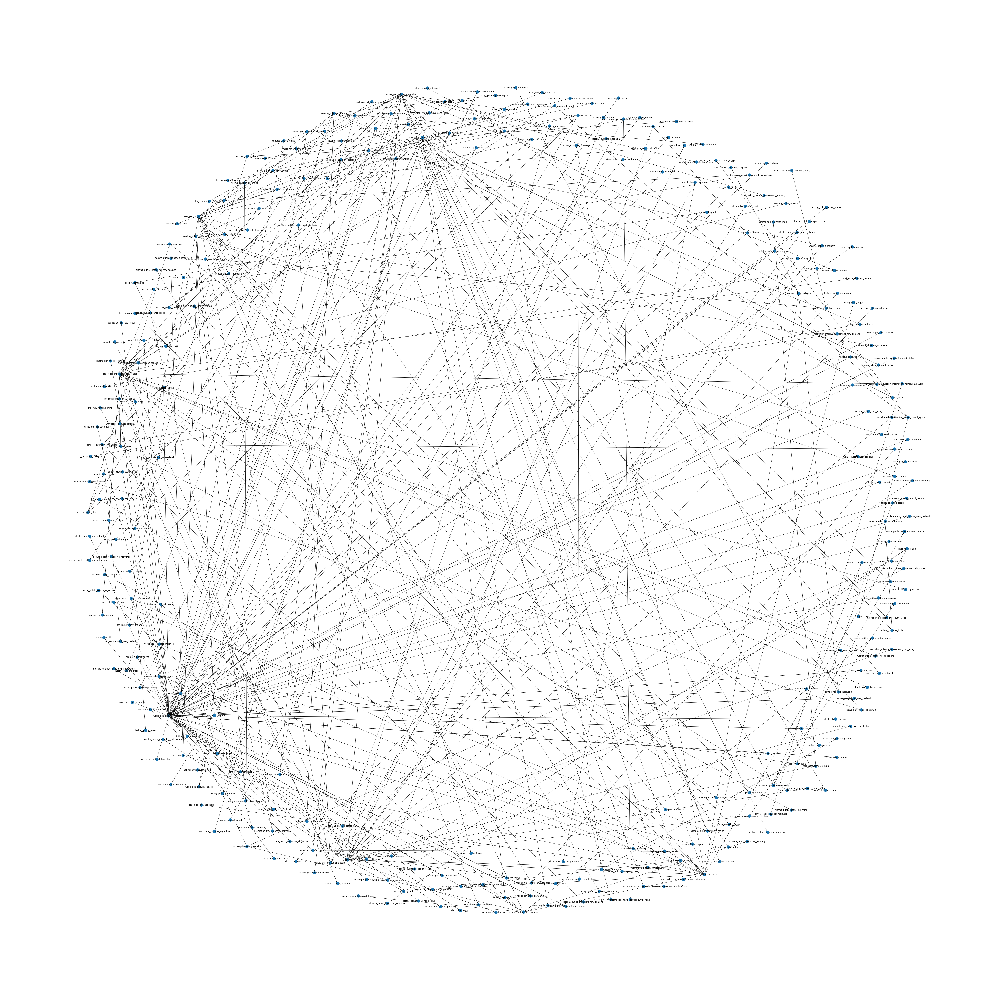

In [8]:
import networkx as nx
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize=(80,80))
nx.draw(model, with_labels=True, ax=ax)
plt.tight_layout()

In [9]:
# sample
print(
    ve.query(
        ["vaccine_policy_china"], evidence={"vaccine_policy_finland": 1}
    )
)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

+-------------------------+-----------------------------+
| vaccine_policy_china    |   phi(vaccine_policy_china) |
+=========================+=============================+
| vaccine_policy_china(0) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(1) |                      1.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(2) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(4) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(5) |                      0.0000 |
+-------------------------+-----------------------------+


In [10]:
 res = ve.query(
        ["vaccine_policy_china"], evidence={"vaccine_policy_finland": 1}
    )
print(res)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

+-------------------------+-----------------------------+
| vaccine_policy_china    |   phi(vaccine_policy_china) |
+=========================+=============================+
| vaccine_policy_china(0) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(1) |                      1.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(2) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(4) |                      0.0000 |
+-------------------------+-----------------------------+
| vaccine_policy_china(5) |                      0.0000 |
+-------------------------+-----------------------------+


In [11]:
res.values

array([0., 1., 0., 0., 0.])

In [12]:
res.variables

['vaccine_policy_china']

In [13]:
res.state_names

{'vaccine_policy_china': [0, 1, 2, 4, 5]}

In [14]:
res.state_names[res.variables[0]]

[0, 1, 2, 4, 5]

In [15]:
[
    (key, val)
    for key, val in zip(res.state_names[res.variables[0]], res.values)
]

[(0, 0.0), (1, 1.0), (2, 0.0), (4, 0.0), (5, 0.0)]

In [16]:
test_df = test_df.astype(int)

In [17]:
cols_to_remove = list(set(test_df.columns) - set(model.nodes()))

In [18]:
cols_to_remove

[]

In [19]:
preds = []
for idx, row in test_df.drop(["date"] + cols_to_remove, axis = 1).iterrows():
  evidence = row.to_dict()
  res = ve.query(
        ["date"], evidence=evidence, show_progress=False
    )
  ans_dict = {}
  for key, val in zip(res.state_names[res.variables[0]], res.values):
    ans_dict[key] = val
  max_val = max(ans_dict, key=ans_dict.get)
  preds.append(max_val)

/usr/local/lib/python3.7/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:472: RuntimeWarning: invalid value encountered in true_divide
  phi.values = phi.values / phi.values.sum()
/usr/local/lib/python3.7/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:537: UserWarning: Found unknown state name. Trying to switch to using all state names as state numbers
  UserWarning,


In [20]:
predictions = []
for t in preds:
  predictions.append(t)
preds_df = pd.DataFrame(predictions, columns = ["date_predicted"])
preds_df

,date_predicted
0,1
1,9
2,8
3,8
4,7
...,...
160,10
161,9
162,3
163,5
